In [ ]:
!nvidia-smi

Mon Nov 23 23:24:35 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.38       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   68C    P8    11W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!git clone https://github.com/richzhang/colorization.git

Cloning into 'colorization'...
remote: Enumerating objects: 61, done.
remote: Counting objects: 100% (61/61), done.
remote: Compressing objects: 100% (47/47), done.
remote: Total 4873 (delta 24), reused 43 (delta 13), pack-reused 4812
Receiving objects: 100% (4873/4873), 178.34 MiB | 39.49 MiB/s, done.
Resolving deltas: 100% (409/409), done.


In [ ]:
!pip install -U setuptools

Requirement already up-to-date: setuptools in /usr/local/lib/python3.6/dist-packages (50.3.2)


In [ ]:
!pip install -r colorization/requirements.txt


ERROR: Command errored out with exit status 1: python setup.py egg_info Check the logs for full command output.


In [ ]:
!python colorization/demo_release.py -i gray_image.jpg

Downloading: "https://colorizers.s3.us-east-2.amazonaws.com/colorization_release_v2-9b330a0b.pth" to /root/.cache/torch/hub/checkpoints/colorization_release_v2-9b330a0b.pth
100% 123M/123M [00:03<00:00, 37.0MB/s]
Downloading: "https://colorizers.s3.us-east-2.amazonaws.com/siggraph17-df00044c.pth" to /root/.cache/torch/hub/checkpoints/siggraph17-df00044c.pth
100% 130M/130M [00:03<00:00, 38.5MB/s]
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/usr/local/lib/python3.6/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
<Figure size 1200x800 with 4 Axes>


In [ ]:
import copy
import numpy as np
import PIL
import torch
import torchvision
import pickle

from PIL import Image, ImageDraw, ImageOps
from typing import Any, List, Tuple

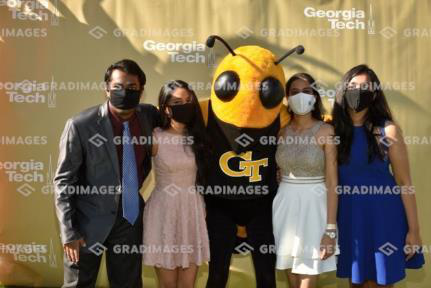

In [ ]:
im = Image.open('/content/1.jpg').convert('RGB')
im

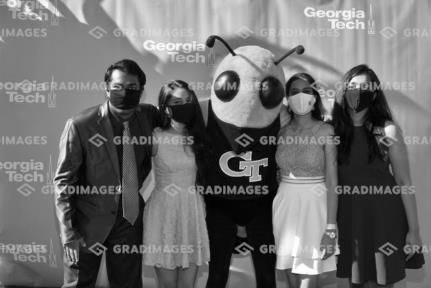

In [ ]:
gray_image = ImageOps.grayscale(im)
gray_image.save('gray_image.jpg')
gray_image

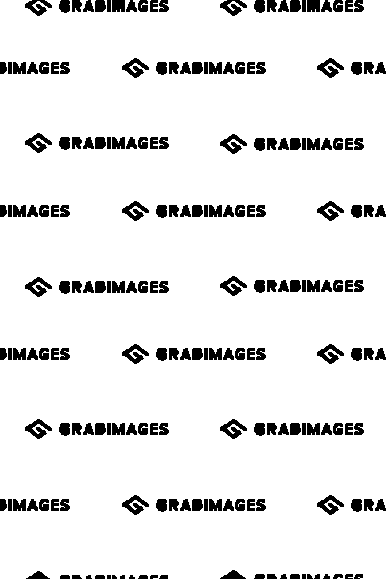

In [ ]:
recolored = Image.open('/content/2.png').convert('RGB')
recolored

In [ ]:
pil2tensor = torchvision.transforms.ToTensor()
recolored_tensor = pil2tensor(recolored)
im_tensor = pil2tensor(im)

In [ ]:
result_tensor = recolored_tensor - im_tensor
result_tensor

RuntimeError: ignored

In [ ]:
result_tensor.shape

torch.Size([3, 2964, 2220])

In [ ]:
result_tensor_clamped = torch.clamp(result_tensor, min=0, max=1)
torchvision.utils.save_image(result_tensor_clamped, "difference_clamped.jpg")

In [ ]:
result_tensor_abs = torch.abs(result_tensor)
torchvision.utils.save_image(result_tensor_abs, "difference_abs.jpg")

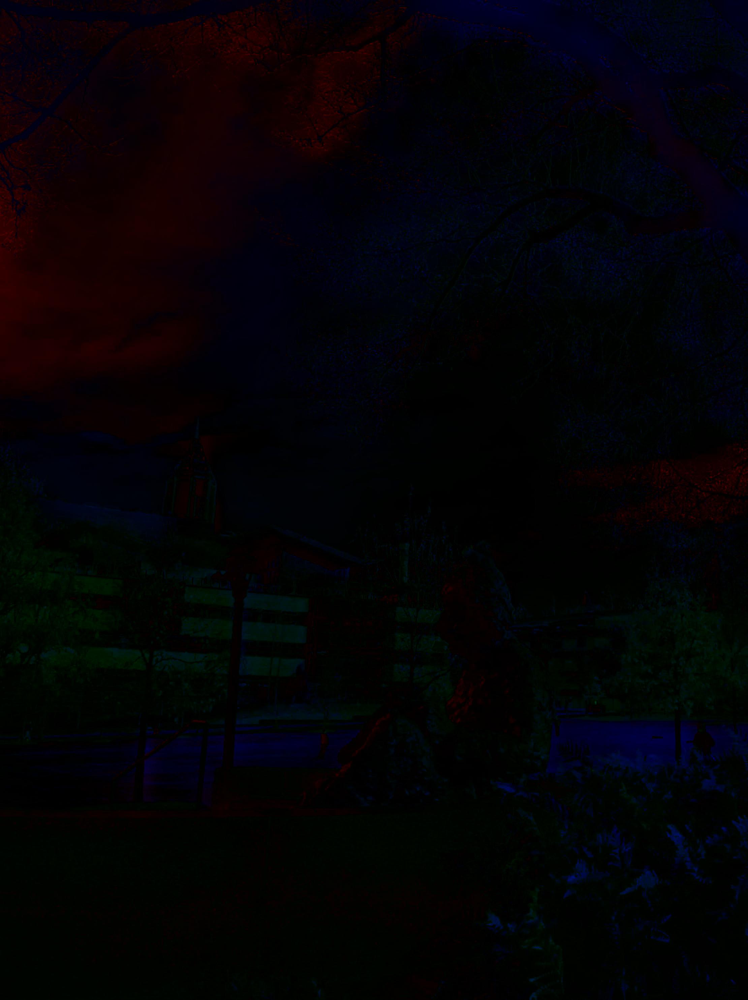

In [ ]:
difference_clamped = Image.open('/content/difference_clamped.jpg').convert('RGB')
difference_clamped

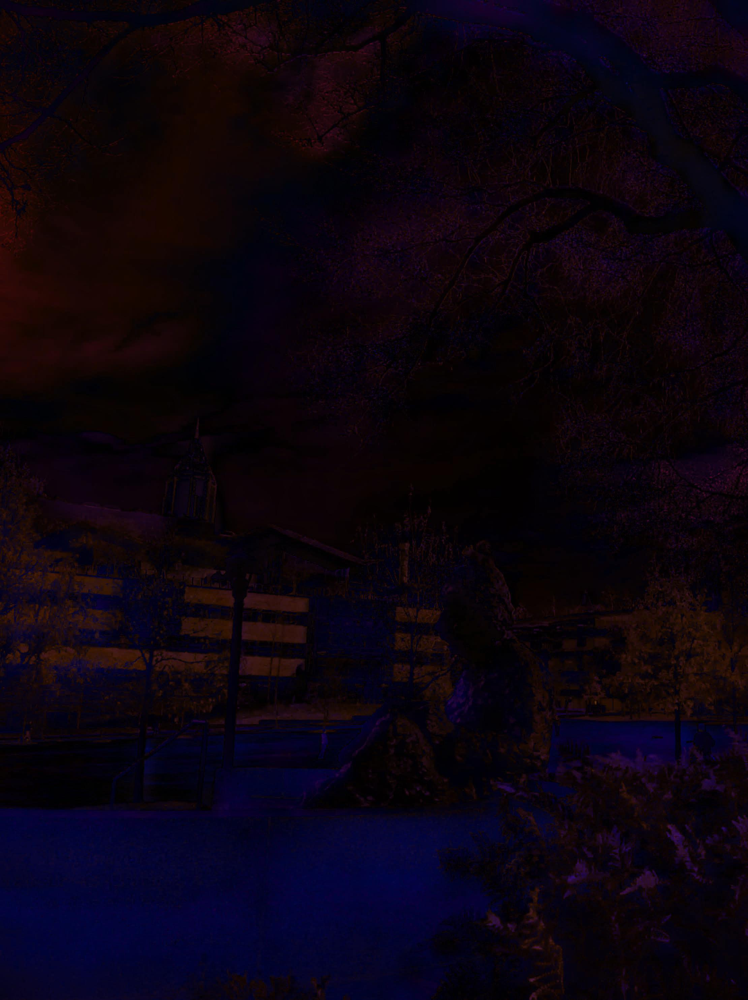

In [ ]:
difference_abs = Image.open('/content/difference_abs.jpg').convert('RGB')
difference_abs

In [ ]:
import matplotlib.pyplot as plt

from colorization.colorizers import *

def colorizer(original_image_path):
	# load colorizers
	colorizer_eccv16 = eccv16(pretrained=True).eval()
	colorizer_siggraph17 = siggraph17(pretrained=True).eval()
	if(torch.device("cuda")):
		colorizer_eccv16.cuda()
		colorizer_siggraph17.cuda()

	# default size to process images is 256x256
	# grab L channel in both original ("orig") and resized ("rs") resolutions
	img = load_img(original_image_path)
	(tens_l_orig, tens_l_rs) = preprocess_img(img, HW=(256,256))
	if(torch.device("cuda")):
		tens_l_rs = tens_l_rs.cuda()

	# colorizer outputs 256x256 ab map
	# resize and concatenate to original L channel
	img_bw = postprocess_tens(tens_l_orig, torch.cat((0*tens_l_orig,0*tens_l_orig),dim=1))
	out_img_eccv16 = postprocess_tens(tens_l_orig, colorizer_eccv16(tens_l_rs).cpu())
	out_img_siggraph17 = postprocess_tens(tens_l_orig, colorizer_siggraph17(tens_l_rs).cpu())

	plt.imsave('saved_eccv16.jpg', out_img_eccv16)
	plt.imsave('saved_siggraph17.jpg', out_img_siggraph17)

	return img, img_bw, out_img_eccv16, out_img_siggraph17

In [ ]:
styles = {}
styles["colour_exp"] = "/content/cexp.jpg"
styles["monsoon"] = "/content/monsoon.jpg"

In [ ]:
from google.colab import files
uploaded = files.upload()
original_image_path = '/content/' + list(uploaded.keys())[0]
print(original_image_path)
img, img_bw, out_img_eccv16, out_img_siggraph17 = colorizer(original_image_path)

Saving ansel_adams3.jpg to ansel_adams3.jpg
/content/ansel_adams3.jpg


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/usr/local/lib/python3.6/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 367 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.6/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 33 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


In [ ]:
#@title Specify the main content image and the style you want to use.  { display-mode: "form" }

style_name = 'monsoon'  # @param ['colour_exp', 'monsoon']

content_path = '/content/saved_siggraph17.jpg'
style_path = styles[style_name]


10


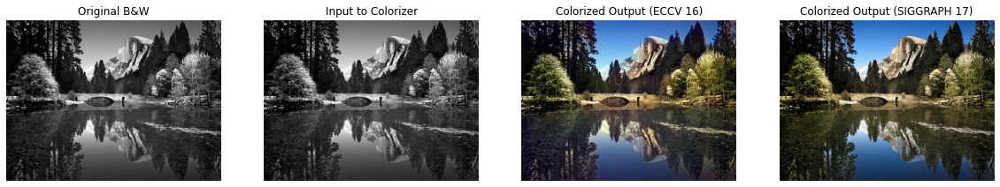

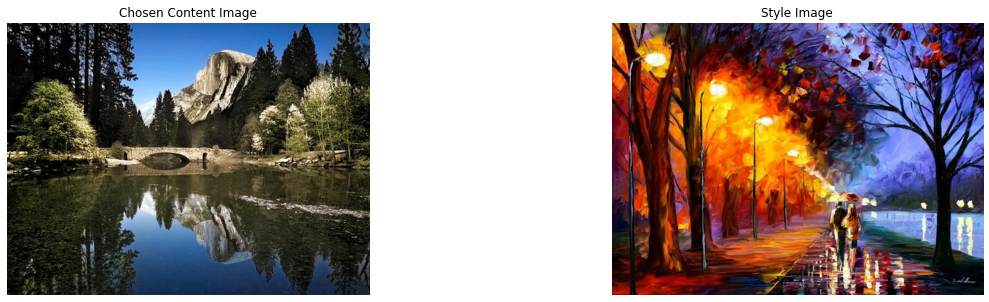

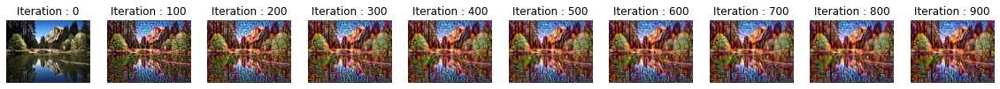

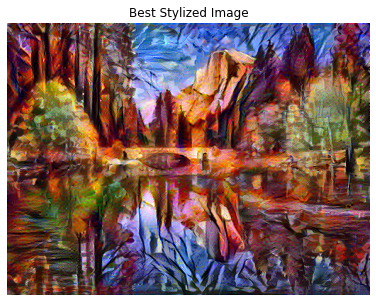

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools

%tensorflow_version 1.x
import tensorflow as tf

from tensorflow.python.keras.preprocessing import image as kp_image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

tf.enable_eager_execution()

def load_img(path_to_img):
  max_dim = 512
  img = Image.open(path_to_img).convert('RGB')
  long = max(img.size)
  scale = max_dim/long
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  
  img = kp_image.img_to_array(img)
  
  # We need to broadcast the image array such that it has a batch dimension 
  img = np.expand_dims(img, axis=0)
  return img

def imshow(img, title=None):
  # Remove the batch dimension
  out = np.squeeze(img, axis=0)
  # Normalize for display 
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)


plt.figure(figsize=(10,10))

content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style, 'Style Image')
plt.show()


def load_and_process_img(path_to_img):
  img = load_img(path_to_img)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
  if len(x.shape) != 3:
    raise ValueError("Invalid input to deprocessing image")
  
  # perform the inverse of the preprocessing step
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer we are interested in
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

def get_model():
  """ Creates our model with access to intermediate layers. 
  
  This function will load the VGG19 model and access the intermediate layers. 
  These layers will then be used to create a new model that will take input image
  and return the outputs from these intermediate layers from the VGG model. 
  
  Returns:
    returns a keras model that takes image inputs and outputs the style and 
      content intermediate layers. 
  """
  # Load our model. We load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Get output layers corresponding to style and content layers 
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Build model 
  return models.Model(vgg.input, model_outputs)

def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))

def gram_matrix(input_tensor):
  # We make the image channels first 
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
  """Expects two images of dimension h, w, c"""
  # height, width, num filters of each layer
  # We scale the loss at a given layer by the size of the feature map and the number of filters
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  
  return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (channels ** 2) * (width * height) ** 2)

def get_feature_representations(model, content_path, style_path):
  """Helper function to compute our content and style feature representations.

  This function will simply load and preprocess both the content and style 
  images from their path. Then it will feed them through the network to obtain
  the outputs of the intermediate layers. 
  
  Arguments:
    model: The model that we are using.
    content_path: The path to the content image.
    style_path: The path to the style image
    
  Returns:
    returns the style features and the content features. 
  """
  # Load our images in 
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)
  
  # batch compute content and style features
  style_outputs = model(style_image)
  content_outputs = model(content_image)
  
  
  # Get the style and content feature representations from our model  
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  """This function will compute the loss total loss.
  
  Arguments:
    model: The model that will give us access to the intermediate layers
    loss_weights: The weights of each contribution of each loss function. 
      (style weight, content weight, and total variation weight)
    init_image: Our initial base image. This image is what we are updating with 
      our optimization process. We apply the gradients wrt the loss we are 
      calculating to this image.
    gram_style_features: Precomputed gram matrices corresponding to the 
      defined style layers of interest.
    content_features: Precomputed outputs from defined content layers of 
      interest.
      
  Returns:
    returns the total loss, style loss, content loss, and total variational loss
  """
  style_weight, content_weight = loss_weights
  
  # Feed our init image through our model. This will give us the content and 
  # style representations at our desired layers. Since we're using eager
  # our model is callable just like any other function!
  model_outputs = model(init_image)
  
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  
  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Accumulate content losses from all layers 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score 
  return loss, style_score, content_score

def compute_grads(cfg):
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

import IPython.display

def run_style_transfer(content_path, 
                       style_path,
                       num_iterations=1000,
                       content_weight=1e3, 
                       style_weight=1e-2): 
  # We don't need to (or want to) train any layers of our model, so we set their
  # trainable to false. 
  model = get_model() 
  for layer in model.layers:
    layer.trainable = False
  
  # Get the style and content feature representations (from our specified intermediate layers) 
  style_features, content_features = get_feature_representations(model, content_path, style_path)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Set initial image
  init_image = load_and_process_img(content_path)
  init_image = tf.Variable(init_image, dtype=tf.float32)
  # Create our optimizer
  opt = tf.train.AdamOptimizer(learning_rate=5, beta1=0.99, epsilon=1e-1)

  # For displaying intermediate images 
  iter_count = 1
  
  # Store our best result
  best_loss, best_img = float('inf'), None
  
  # Create a nice config 
  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }
    
  # For displaying
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  
  stylised_imgs = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 
    
    if loss < best_loss:
      # Update best loss and best image from total loss. 
      best_loss = loss
      best_img = deprocess_img(init_image.numpy())

    if i % display_interval== 0:
      start_time = time.time()
      
      # Use the .numpy() method to get the concrete numpy array
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      stylised_imgs.append((plot_img, i))
      IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      print('Iteration: {}'.format(i))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  IPython.display.clear_output(wait=True)
  return stylised_imgs, best_img, best_loss 

num_iterations = 1000
stylised_imgs, best, best_loss = run_style_transfer(content_path, style_path, num_iterations)

print(len(stylised_imgs))

best_style_output = Image.fromarray(best)
best_style_output.save('stylised_image.jpg')
best_style_output

def show_results(original_bw, input_bw, out_img_eccv16, out_img_siggraph17, best_img, content_path, style_path, stylised_imgs, num_iterations, show_large_final=True):
  plt.figure(figsize=(20,5))
  plt.subplot(1,4,1)
  plt.imshow(original_bw)
  plt.title('Original B&W')
  plt.axis('off')

  plt.subplot(1,4,2)
  plt.imshow(input_bw)
  plt.title('Input to Colorizer')
  plt.axis('off')

  plt.subplot(1,4,3)
  plt.imshow(out_img_eccv16)
  plt.title('Colorized Output (ECCV 16)')
  plt.axis('off')

  plt.subplot(1,4,4)
  plt.imshow(out_img_siggraph17)
  plt.title('Colorized Output (SIGGRAPH 17)')
  plt.axis('off')
  plt.show()

  plt.figure(figsize=(20, 5))
  content = load_img(content_path) 
  style = load_img(style_path)

  plt.subplot(1, 2, 1)
  plt.axis('off')
  imshow(content, 'Chosen Content Image')

  plt.subplot(1, 2, 2)
  plt.axis('off')
  imshow(style, 'Style Image')

  plt.figure(figsize=(20,10))
  for i in range(len(stylised_imgs)):
      plt.subplot(2, 10, i+1)
      plt.title('Iteration : ' + str(stylised_imgs[i][1]))
      plt.imshow(stylised_imgs[i][0])
      plt.axis('off')

  plt.figure(figsize=(20, 5))
  plt.subplot(1, 1, 1)
  plt.axis('off')
  plt.imshow(best_img)
  plt.title('Best Stylized Image')
  plt.show()

show_results(img, img_bw, out_img_eccv16, out_img_siggraph17, best, content_path, style_path, stylised_imgs, num_iterations)

In [ ]:
# import IPython.display

# def run_style_transfer(content_path, 
#                        style_path,
#                        num_iterations=1000,
#                        content_weight=1e3, 
#                        style_weight=1e-2): 
#   # We don't need to (or want to) train any layers of our model, so we set their
#   # trainable to false. 
#   model = get_model() 
#   for layer in model.layers:
#     layer.trainable = False
  
#   # Get the style and content feature representations (from our specified intermediate layers) 
#   style_features, content_features = get_feature_representations(model, content_path, style_path)
#   gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
#   # Set initial image
#   init_image = load_and_process_img(content_path)
#   init_image = tf.Variable(init_image, dtype=tf.float32)
#   # Create our optimizer
#   opt = tf.train.AdamOptimizer(learning_rate=5, beta1=0.99, epsilon=1e-1)

#   # For displaying intermediate images 
#   iter_count = 1
  
#   # Store our best result
#   best_loss, best_img = float('inf'), None
  
#   # Create a nice config 
#   loss_weights = (style_weight, content_weight)
#   cfg = {
#       'model': model,
#       'loss_weights': loss_weights,
#       'init_image': init_image,
#       'gram_style_features': gram_style_features,
#       'content_features': content_features
#   }
    
#   # For displaying
#   num_rows = 2
#   num_cols = 5
#   display_interval = num_iterations/(num_rows*num_cols)
#   start_time = time.time()
#   global_start = time.time()
  
#   norm_means = np.array([103.939, 116.779, 123.68])
#   min_vals = -norm_means
#   max_vals = 255 - norm_means   
  
#   imgs = []
#   for i in range(num_iterations):
#     grads, all_loss = compute_grads(cfg)
#     loss, style_score, content_score = all_loss
#     opt.apply_gradients([(grads, init_image)])
#     clipped = tf.clip_by_value(init_image, min_vals, max_vals)
#     init_image.assign(clipped)
#     end_time = time.time() 
    
#     if loss < best_loss:
#       # Update best loss and best image from total loss. 
#       best_loss = loss
#       best_img = deprocess_img(init_image.numpy())

#     if i % display_interval== 0:
#       start_time = time.time()
      
#       # Use the .numpy() method to get the concrete numpy array
#       plot_img = init_image.numpy()
#       plot_img = deprocess_img(plot_img)
#       imgs.append(plot_img)
#       IPython.display.clear_output(wait=True)
#       IPython.display.display_png(Image.fromarray(plot_img))
#       print('Iteration: {}'.format(i))        
#       print('Total loss: {:.4e}, ' 
#             'style loss: {:.4e}, '
#             'content loss: {:.4e}, '
#             'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
#   print('Total time: {:.4f}s'.format(time.time() - global_start))
#   IPython.display.clear_output(wait=True)
#   plt.figure(figsize=(14,4))
#   for i,img in enumerate(imgs):
#       plt.subplot(num_rows,num_cols,i+1)
#       plt.imshow(img)
#       plt.xticks([])
#       plt.yticks([])
     
#   return best_img, best_loss 

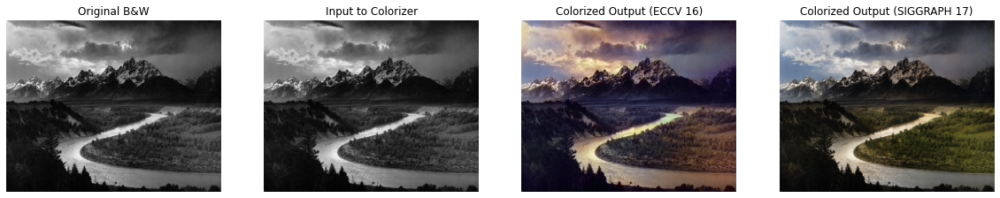

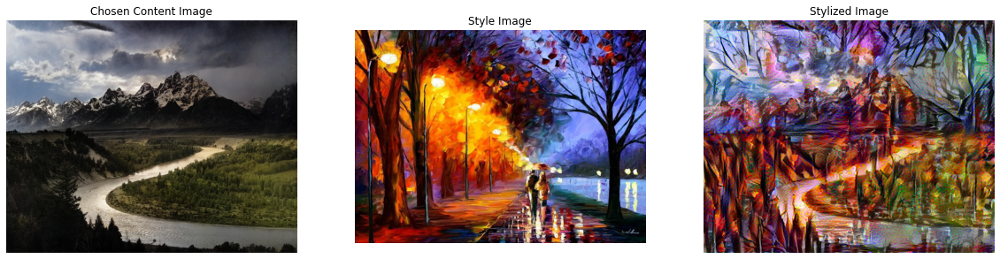

In [ ]:
# def show_results(original_bw, input_bw, out_img_eccv16, out_img_siggraph17, best_img, content_path, style_path, show_large_final=True):
#   plt.figure(figsize=(20,5))
#   plt.subplot(1,4,1)
#   plt.imshow(original_bw)
#   plt.title('Original B&W')
#   plt.axis('off')

#   plt.subplot(1,4,2)
#   plt.imshow(input_bw)
#   plt.title('Input to Colorizer')
#   plt.axis('off')

#   # plt.figure(figsize=(10,5))
#   plt.subplot(1,4,3)
#   plt.imshow(out_img_eccv16)
#   plt.title('Colorized Output (ECCV 16)')
#   plt.axis('off')

#   plt.subplot(1,4,4)
#   plt.imshow(out_img_siggraph17)
#   plt.title('Colorized Output (SIGGRAPH 17)')
#   plt.axis('off')
#   plt.show()

#   plt.figure(figsize=(20, 5))
#   content = load_img(content_path) 
#   style = load_img(style_path)

#   plt.subplot(1, 3, 1)
#   plt.axis('off')
#   imshow(content, 'Chosen Content Image')

#   plt.subplot(1, 3, 2)
#   plt.axis('off')
#   imshow(style, 'Style Image')

#   if show_large_final: 
#     # plt.figure(figsize=(10, 10))
#     plt.subplot(1, 3, 3)
#     plt.axis('off')
#     plt.imshow(best_img)
#     plt.title('Stylized Image')
#     plt.show()

# show_results(img, img_bw, out_img_eccv16, out_img_siggraph17, best, content_path, style_path)